Adapted from [this tutorial](https://machinelearningmastery.com/how-to-perform-face-detection-with-classical-and-deep-learning-methods-in-python-with-keras/).

In [70]:
#Run this cell to be able to access required data
#Follow the instructions displayed in the output
from google.colab import auth
from googleapiclient.discovery import build
auth.authenticate_user()
drive_service = build('drive', 'v3')

# Introduction
Face detection is a computer vision problem that involves finding faces in photos. It is a trivial problem for humans to solve and has been solved reasonably well by classical feature-based techniques, such as the cascade classifier (see below). More recently deep learning methods have achieved state-of-the-art results on standard benchmark face detection datasets. One example is the Multi-task Cascade Convolutional Neural Network, or MTCNN for short.

<img src="http://kpzhang93.github.io/SPL/stylesheets/image007.png" width="500">

In this assignment, you will discover how to perform face detection in Python using classical and deep learning models.

The two main approaches to face recognition: 


1.   Feature-based: use hand-crafted filters to search for and detect faces
2.   Deep learning: learn holistically how to extract faces from the entire image





# Part 1) Feature-based Cascaded Classifier
Feature-based face detection algorithms are fast and effective and have been used successfully for decades. Perhaps the most successful example is a technique called cascade classifiers first described by Paul Viola and Michael Jones and their 2001 paper titled “Rapid Object Detection using a Boosted Cascade of Simple Features.”

In the paper, the AdaBoost model is used to learn a range of very simple or weak features in each face, that together provide a robust classifier. The models are then organized into a hierarchy of increasing complexity, called a “cascade”. Simpler classifiers operate on candidate face regions directly, acting like a coarse filter, whereas complex classifiers operate only on those candidate regions that show the most promise as faces.

We are going to use a modern implementation of the Classifier Cascade face detection algorithm as provided in the OpenCV library. The benefit of this implementation is that it provides pre-trained face detection models, and provides an interface to train a model on your own dataset.

## Load test images and pre-trained models
Run the below cell to download some test images and the pre-trainined models. Add your own test image by pasting a link to `image_3_url`. Find an image with frontal faces of a group of people that you think will be difficult for the classifier. 

In [71]:
import urllib.request
import matplotlib.pyplot as plt
model1_url = "https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml"
urllib.request.urlretrieve(model1_url, "haarcascade_frontalface_default.xml")
model2_url = "https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_eye.xml"
urllib.request.urlretrieve(model2_url, "haarcascade_eye.xml")
image1_url = "https://thumbor.forbes.com/thumbor/fit-in/1200x0/filters%3Aformat%28jpg%29/https%3A%2F%2Fspecials-images.forbesimg.com%2Fimageserve%2F6052170a9df9bdf69d63f201%2F0x0.jpg"
urllib.request.urlretrieve(image1_url, "test_1.jpg")
image2_url = "https://pbs.twimg.com/media/BhxWutnCEAAtEQ6.jpg"
urllib.request.urlretrieve(image2_url, "test_2.jpg")
image3_url = "https://farm2.staticflickr.com/1833/43116940774_e387b5cc9d_h.jpg"
urllib.request.urlretrieve(image3_url, "test_3.jpg")

('test_3.jpg', <http.client.HTTPMessage at 0x7fe8abbb6050>)

## Q1) Face detection (3)
Load the face detection model ("haarcascade_frontalface_default.xml") and run it on the three test images. 
**Hint: see [documentation](https://docs.opencv.org/4.5.3/d9/d80/classcv_1_1cuda_1_1CascadeClassifier.html) or [tutorial](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_objdetect/py_face_detection/py_face_detection.html)**



1.   Plot the overlayed bounding boxes of the detections for each image
2.   For "test_2.jpg" adjust the parameters `minNeighbors` and `scaleFactor`. Describe what the parameters control and how they affect the face detection. Give a set of parameters that improve the detection over the default values.
3. Comment on the performance of the detector on the image you selected for "test_3.jpg". Describe the failure points of the detector. Apply the same parameters you selected in *Q1.2)*.  Does it improve the performance?




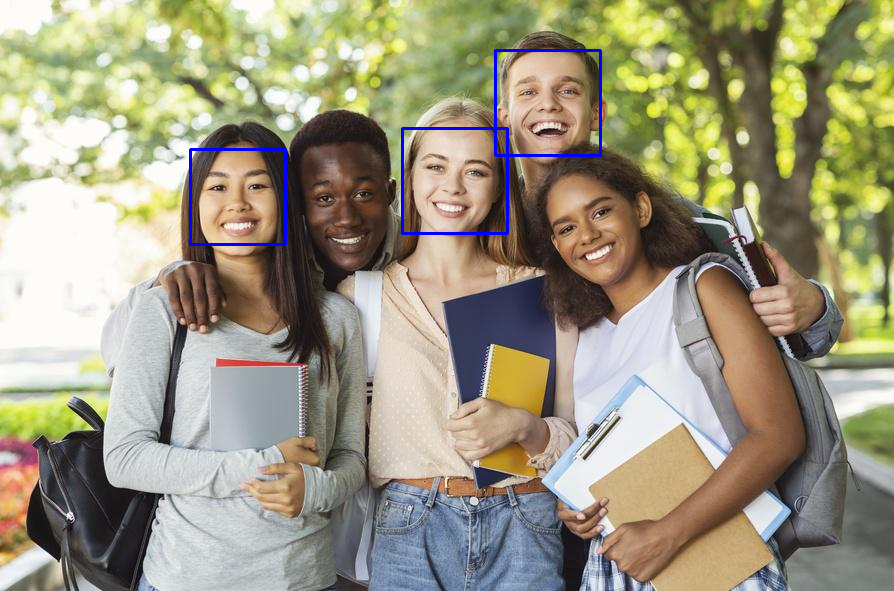

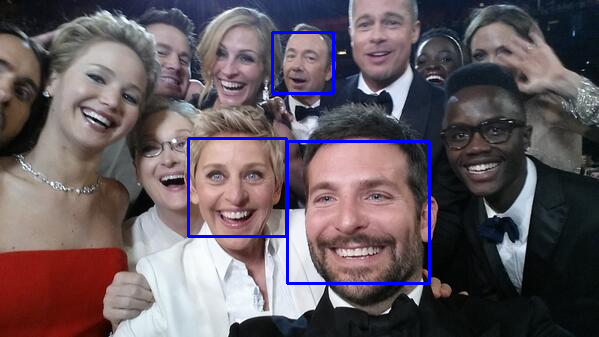

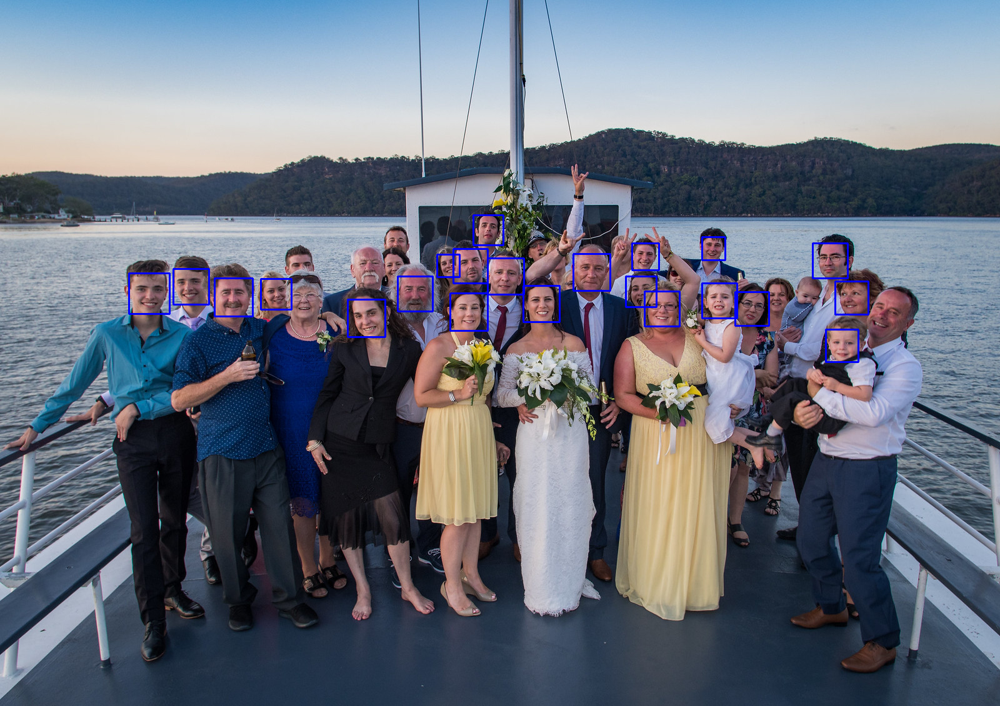

In [72]:
#Function to load classifier
import cv2
import numpy as np
import matplotlib.pyplot as plt
from cv2 import CascadeClassifier
from google.colab.patches import cv2_imshow

#Solution here:
#Q1.1: Plot the overlayed bounding boxes of the detections for each image
face_cascade=cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
img1=cv2.imread('test_1.jpg')
img2=cv2.imread('test_2.jpg')
img3=cv2.imread('test_3.jpg')
images=[img1,img2,img3]
for img in images:
  gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  faces=face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)
  for (x,y,w,h) in faces:
    img=cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
  cv2_imshow(img)
  cv2.waitKey(0)


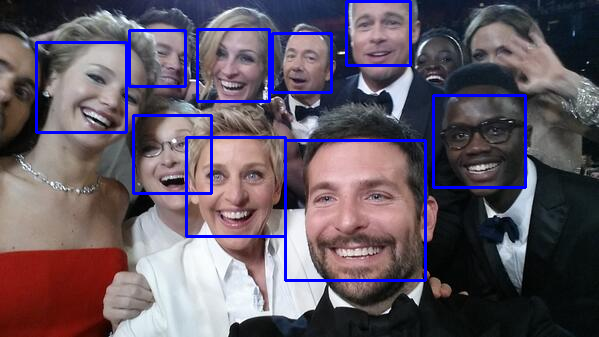

-1

In [73]:
#Solution here:
#Q1.2: For "test_2.jpg" adjust the parameters minNeighbors and scaleFactor
img2=cv2.imread('test_2.jpg')
gray=cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)
faces=face_cascade.detectMultiScale(gray, scaleFactor=1.04, minNeighbors=3)
for (x,y,w,h) in faces:
  img=cv2.rectangle(img2,(x,y),(x+w,y+h),(255,0,0),2)
cv2_imshow(img)
cv2.waitKey(0)

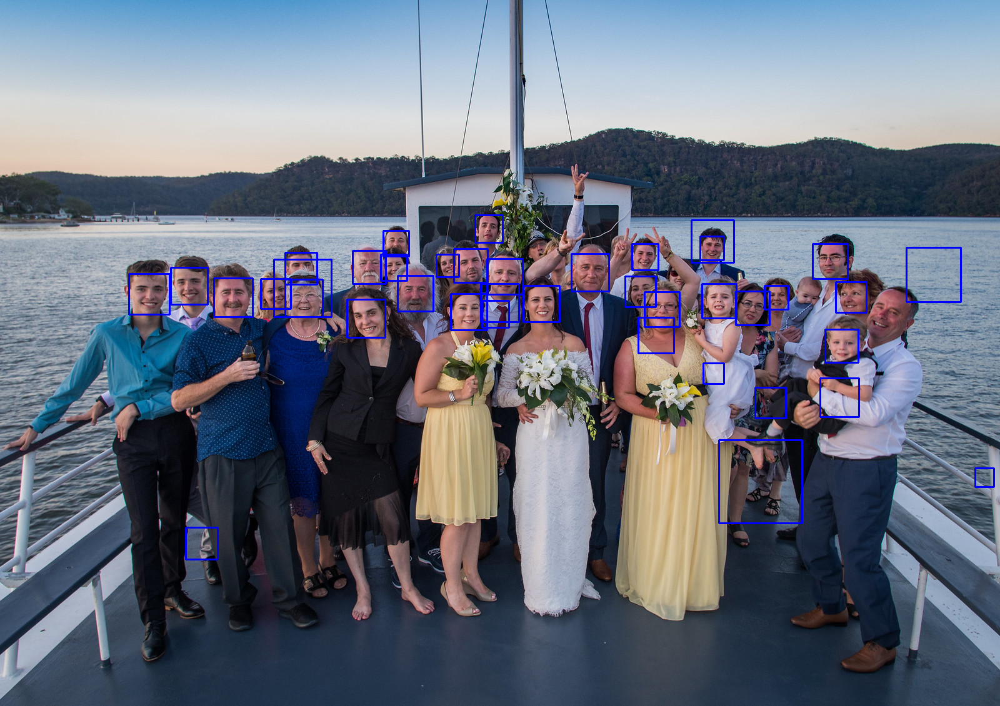

-1

In [74]:
#Solution here:
#Q1.3: Apply the same parameters you selected in Q1.2).
img3=cv2.imread('test_3.jpg')
gray=cv2.cvtColor(img3,cv2.COLOR_BGR2GRAY)
faces=face_cascade.detectMultiScale(gray, scaleFactor=1.04, minNeighbors=3)
for (x,y,w,h) in faces:
  img=cv2.rectangle(img3,(x,y),(x+w,y+h),(255,0,0),2)
cv2_imshow(img)
cv2.waitKey(0)

*Discussion here:*

*Q1.2)*
**Describe what the parameters control and how they affect the face detection. Give a set of parameters that improve the detection over the default values.**

Answer:

minNeighbors: This parameter specifies how many neighbors should be kept for each candidate rectangle which controls the quality of the detected faces. Higher values for minNeighbors will cause less detections but higher quality. Or to say the more neighbors (higher value for minNeighbors) it has, the more accurate the detection result could be, which also means increasing the possibility that there is indeed human face in your bounded box for detection.

scaleFactor: This parameter specifies how the input image was rescaled or resized during each detection pass. Using a proper value for scaleFactor would increase the chance of finding a size that matches the model for detection (likely to detect more faces in the image). Usually, when the value gets smaller, the precision get improved. But if it is too small, the detection can be over-precise.

A set of parameters I choose for Q1.2 is （scaleFactor=1.04, minNeighbors=3）


*Q1.3)*
**Comment on the performance of the detector on the image you selected for "test_3.jpg". Describe the failure points of the detector. Apply the same parameters you selected in Q1.2). Does it improve the performance?**

By applying the default parameters on testing image 3, the result is not too bad. Many of human faces were detected, but some of them were still missed. Since there are many faces in image 3 and people are standing really close to each other, some of those whose faces are tilted or covered, the precision of the detection using the default parameters can be relatively low which is the main reason causing the failure points of the detector. The light on the face is too dark can also be the reason for detection failure.

By applying the same parameters I selected in Q1.2, the performance got improved. More faces were detected, which mean the values are better than the default ones. However, we got some over-predict boxes that there is no human face inside. To solve this, we can increase the value for minNeighbors.

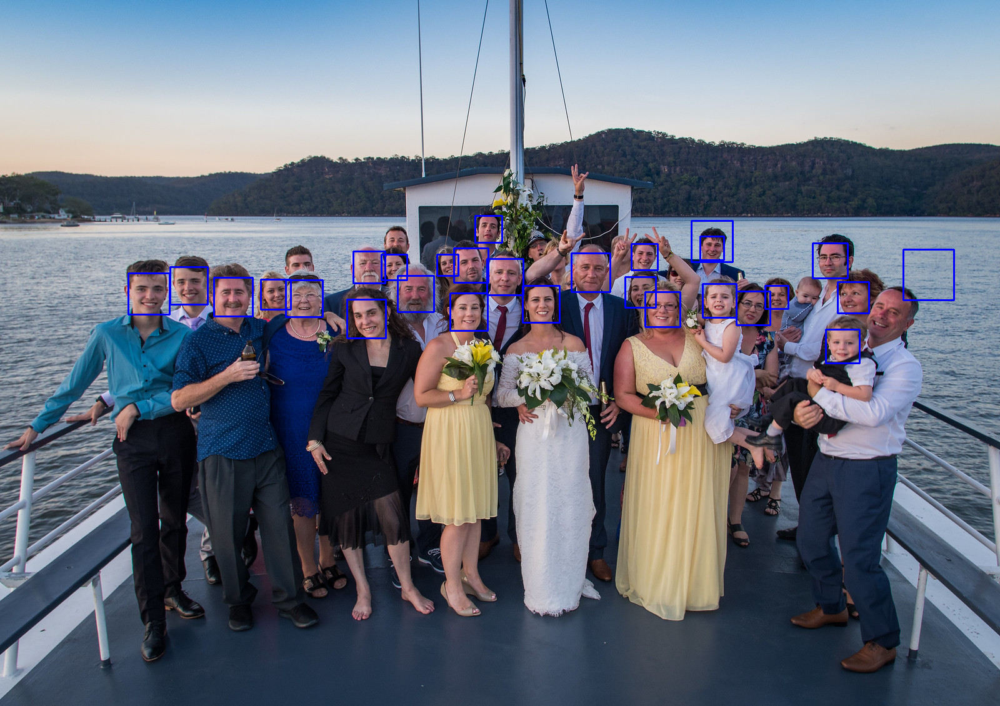

-1

In [75]:
#Adapted Q1.3 Solution here:
#Q1.3: Modify a little bit after applying the same parameters you selected in Q1.2).
img3=cv2.imread('test_3.jpg')
gray=cv2.cvtColor(img3,cv2.COLOR_BGR2GRAY)
faces=face_cascade.detectMultiScale(gray, scaleFactor=1.05, minNeighbors=7)
for (x,y,w,h) in faces:
  img=cv2.rectangle(img3,(x,y),(x+w,y+h),(255,0,0),2)
cv2_imshow(img)
cv2.waitKey(0)

## Q2) Face Landmark Detection (3)
Load the eye detection model ("haarcascade_eye.xml") and run it on "test_1.jpg".


1.   Plot the overlayed bounding boxes of the detections
2.   Comment on the performance of this task on the test image and describe the failure points of the detector. Based on this performance, do you think this is a more difficult task than face detection, why or why not?
3. Give a set of parameters that improve the detection over the default values. What improvement is seen from changing the parameters?


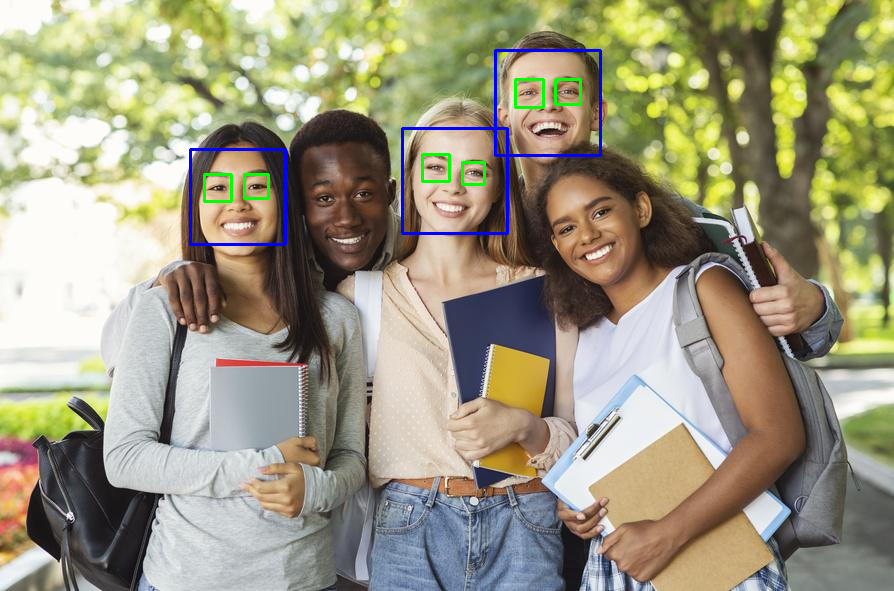

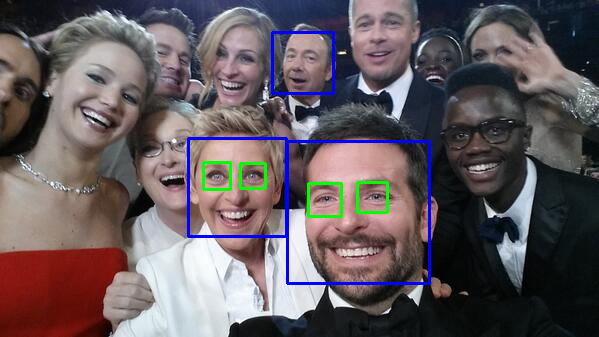

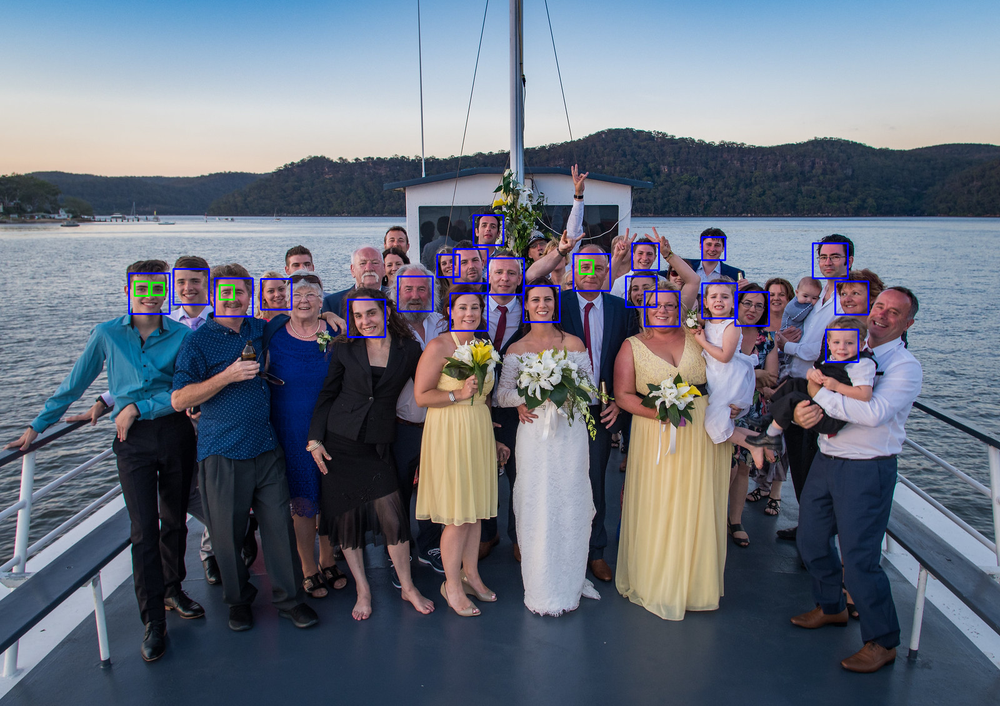

In [76]:
#Solution here:
#default version
#Q2.1: Plot the overlayed bounding boxes of the detections
eye_cascade=cv2.CascadeClassifier('haarcascade_eye.xml')
img1=cv2.imread('test_1.jpg')
img2=cv2.imread('test_2.jpg')
img3=cv2.imread('test_3.jpg')
images=[img1,img2,img3]
for img in images:
  gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  faces=face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)
  for (x,y,w,h) in faces:
    img=cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    roi_gray=gray[y:y+h, x:x+w]
    roi_color=img[y:y+h, x:x+w]
    eyes=eye_cascade.detectMultiScale(roi_gray)
    for(ex,ey,ew,eh) in eyes:
      cv2.rectangle(roi_color,(ex,ey),(ex+ew,ey+eh),(0,255,0),2)
  cv2_imshow(img)
  cv2.waitKey(0)

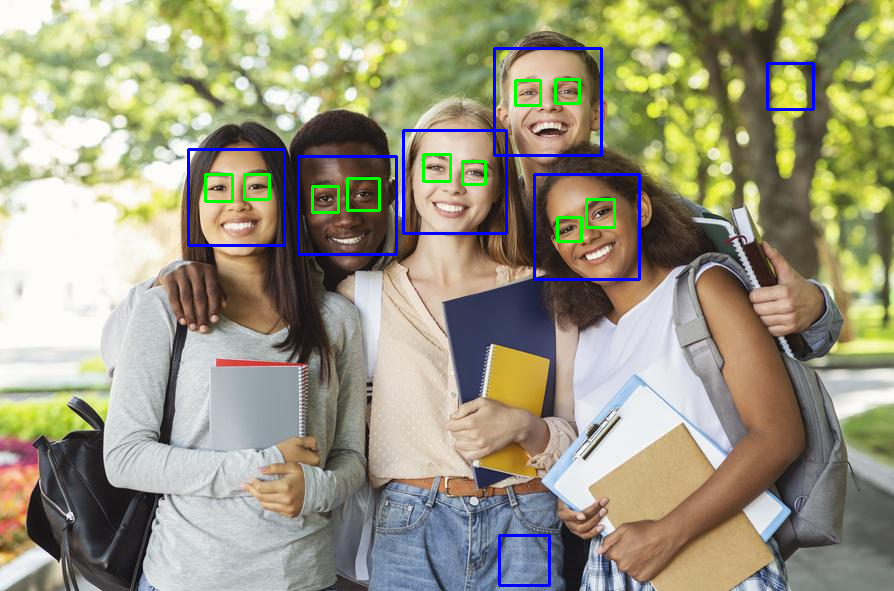

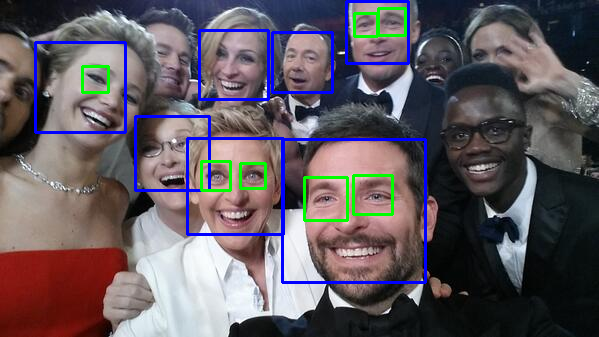

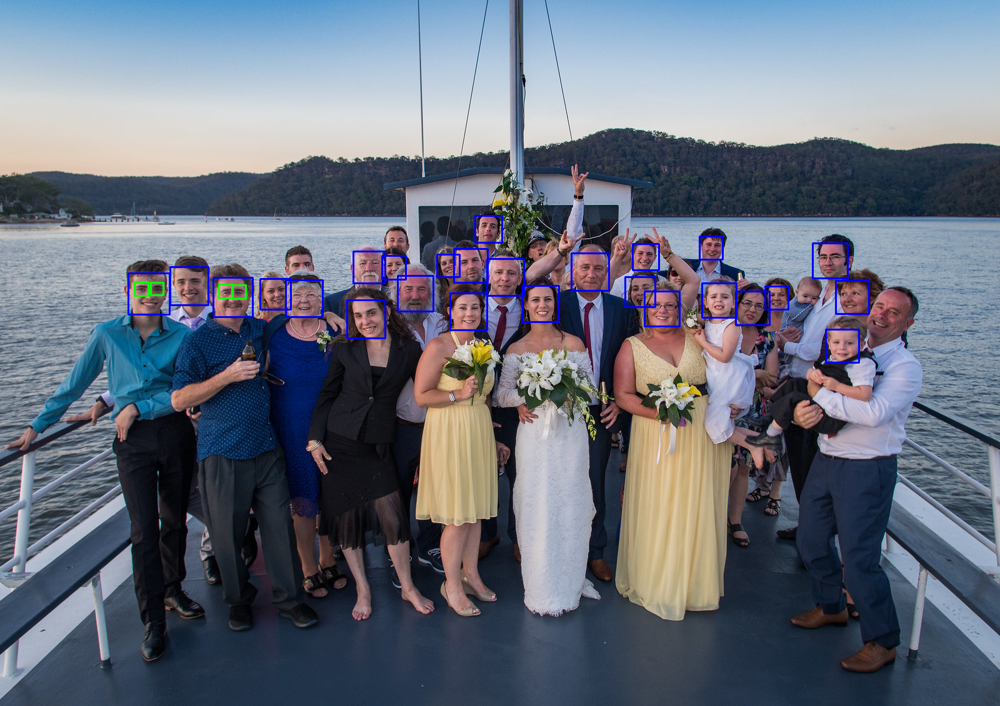

In [77]:
#Solution here:
#adapted version
#Q2.1: Plot the overlayed bounding boxes of the detections
eye_cascade=cv2.CascadeClassifier('haarcascade_eye.xml')
img1=cv2.imread('test_1.jpg')
img2=cv2.imread('test_2.jpg')
img3=cv2.imread('test_3.jpg')
images=[img1,img2,img3]
for img in images:
  gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  faces=face_cascade.detectMultiScale(gray, scaleFactor=1.07, minNeighbors=5)
  for (x,y,w,h) in faces:
    img=cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    roi_gray=gray[y:y+h, x:x+w]
    roi_color=img[y:y+h, x:x+w]
    eyes=eye_cascade.detectMultiScale(roi_gray)
    for(ex,ey,ew,eh) in eyes:
      cv2.rectangle(roi_color,(ex,ey),(ex+ew,ey+eh),(0,255,0),2)
  cv2_imshow(img)
  cv2.waitKey(0)

*Discussion here:*

*Q2.2)*
**Comment on the performance of this task on the test image and describe the failure points of the detector. Based on this performance, do you think this is a more difficult task than face detection, why or why not?**

Our model performs fine on the first test image where there are not too many faces, the size of faces and eyes are not too small or the faces are not tilted or sideways or covered. For the other two images, there are many failure points. It is failed mostly on those whose faces or eyes are tilted or covered or whose eyes are too small. 

It is definitely a more difficult task than face detection. Firstly, the eye detection is totally based on the face detection. If the face of one person is not detected, nor will his eyes. Next, eyes are even smaller object to be detect compared with faces which requires more strict balance between accuracy and precision. Furthermore, in a photo, people all have different facial expressions, and their eyes are all in different shapes in a very small area, which alse make the detection much harder than face detection.


*Q2.3)*
**Give a set of parameters that improve the detection over the default values. What improvement is seen from changing the parameter**

scaleFactor=1.07, minNeighbors=5

With this set of parameters, more faces in the image were detected, even a few that is tilted or covered. But those faces that are heavily covered or tilted or very dark still can not be detected. Number of eyes correctly detected also increases. But the prerequisite for being able to be detected is still very strict. Only those whose eyes appear large and bright in the photo, or look straight at the camera have the chance to be detected. 

# Part 2) Deep Learning - MTCNN
Multi-task Cascaded Convolutional Networks (MTCNN) is a framework developed as a solution for both face detection and face alignment. The process consists of three stages of convolutional networks that are able to recognize faces and landmark location such as eyes, nose, and mouth.
The [paper](https://arxiv.org/ftp/arxiv/papers/1604/1604.02878.pdf) proposes MTCNN as a way to integrate both tasks (recognition and alignment) using multi-task learning.


<img src="https://machinelearningmastery.com/wp-content/uploads/2019/03/Collage-Students-Photograph-with-Bounding-Boxes-and-Facial-Keypoints-Drawn-For-Each-Detected-Face-using-MTCNN.png" width="500">

[Source](https://machinelearningmastery.com/how-to-perform-face-detection-with-classical-and-deep-learning-methods-in-python-with-keras/)

## Q3) MTCNN Architecture (1)

Skim the MTCNN paper. Name and describe the three stages of MTCNN, provide the equation (latex format) for the loss function of each task and state the type of problem (i.e. regression or classification) for each loss function. Provide your answer in the cell below.

*Discussion here:*

Stages:
1. Face Classification using Proposal Network (P-Net): Quickly generate candidate windows and obtain its bounding box regression vector through a shallow CNN. 
2. Bounding Box Regression using Refine Network (R-Net): In order to refine the candidate windows, use a more conplex CNN to check if a window is not a face region and perform calibration with bounding box regression.
3. Facial Landmark Localization using Output Network (O-Net): Apply a more powerful CNN to refine/scan the potential windows and output face-detection landmark.

Loss functions:
1. Loss function for face classification: (classification)

$${L_{i}}^{det}=-({y_{i}}^{det}log(p{i})+(1-{y_{i}}^{det})(1-log(p{i})))$$

2. Loss function for bounding box regression: (regression)

$${L_{i}}^{box}= \left \| {\widehat{y}_{i}}^{box}-{{y}_{i}}^{box}\right \|_{2}^{2}$$

3. Loss function for facial landmark localization: (regression)

$${L_{i}}^{landmark}= \left \| {\widehat{y}_{i}}^{landmark}-{{y}_{i}}^{landmark}\right \|_{2}^{2}$$

## Q4) MTCNN on Test Images (3)

Apply MTCNN on the test images from Part 1. Overlay the bounding boxes and the landmarks on each image and plot the results. That is, each image should be displayed with each face bounding box and corresponding landmarks added to the image (similar to the one shown in the Part 2 introduction). Compare these results to those from *Q1)* and discuss.

[{'box': [546, 177, 90, 105], 'confidence': 0.9999775886535645, 'keypoints': {'left_eye': (567, 228), 'right_eye': (602, 212), 'nose': (586, 237), 'mouth_left': (580, 259), 'mouth_right': (615, 243)}}, {'box': [416, 125, 77, 108], 'confidence': 0.9999321699142456, 'keypoints': {'left_eye': (438, 166), 'right_eye': (475, 172), 'nose': (453, 189), 'mouth_left': (430, 200), 'mouth_right': (470, 207)}}, {'box': [506, 52, 82, 108], 'confidence': 0.9993744492530823, 'keypoints': {'left_eye': (529, 92), 'right_eye': (568, 91), 'nose': (548, 105), 'mouth_left': (530, 129), 'mouth_right': (568, 128)}}, {'box': [200, 146, 75, 106], 'confidence': 0.999169111251831, 'keypoints': {'left_eye': (219, 187), 'right_eye': (256, 186), 'nose': (237, 205), 'mouth_left': (218, 224), 'mouth_right': (259, 223)}}, {'box': [295, 147, 89, 120], 'confidence': 0.9987404942512512, 'keypoints': {'left_eye': (324, 199), 'right_eye': (366, 193), 'nose': (348, 218), 'mouth_left': (327, 239), 'mouth_right': (369, 234)}}

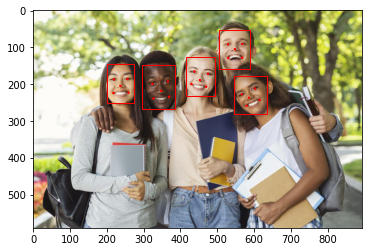

[{'box': [195, 132, 79, 110], 'confidence': 0.9999880790710449, 'keypoints': {'left_eye': (216, 174), 'right_eye': (254, 174), 'nose': (234, 200), 'mouth_left': (216, 210), 'mouth_right': (255, 211)}}, {'box': [303, 137, 113, 155], 'confidence': 0.9999879598617554, 'keypoints': {'left_eye': (325, 199), 'right_eye': (379, 195), 'nose': (345, 225), 'mouth_left': (327, 248), 'mouth_right': (387, 246)}}, {'box': [282, 32, 45, 65], 'confidence': 0.999964714050293, 'keypoints': {'left_eye': (291, 55), 'right_eye': (311, 57), 'nose': (295, 67), 'mouth_left': (289, 79), 'mouth_right': (307, 81)}}, {'box': [349, 0, 65, 76], 'confidence': 0.9999572038650513, 'keypoints': {'left_eye': (364, 24), 'right_eye': (393, 22), 'nose': (377, 39), 'mouth_left': (366, 55), 'mouth_right': (393, 53)}}, {'box': [59, 40, 86, 108], 'confidence': 0.9999312162399292, 'keypoints': {'left_eye': (98, 78), 'right_eye': (132, 97), 'nose': (112, 102), 'mouth_left': (80, 107), 'mouth_right': (116, 126)}}, {'box': [209, 2

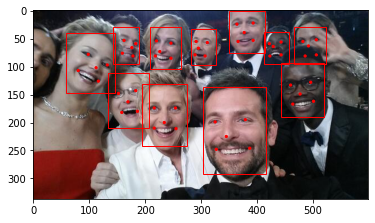

[{'box': [785, 416, 43, 55], 'confidence': 1.0, 'keypoints': {'left_eye': (798, 436), 'right_eye': (818, 437), 'nose': (808, 447), 'mouth_left': (798, 457), 'mouth_right': (815, 458)}}, {'box': [1015, 389, 31, 42], 'confidence': 0.9999998807907104, 'keypoints': {'left_eye': (1024, 406), 'right_eye': (1039, 407), 'nose': (1032, 414), 'mouth_left': (1022, 419), 'mouth_right': (1038, 420)}}, {'box': [342, 443, 55, 68], 'confidence': 0.999998927116394, 'keypoints': {'left_eye': (360, 469), 'right_eye': (383, 468), 'nose': (373, 480), 'mouth_left': (361, 492), 'mouth_right': (383, 490)}}, {'box': [1038, 464, 44, 58], 'confidence': 0.9999988079071045, 'keypoints': {'left_eye': (1050, 488), 'right_eye': (1071, 489), 'nose': (1059, 499), 'mouth_left': (1048, 507), 'mouth_right': (1070, 508)}}, {'box': [843, 457, 42, 59], 'confidence': 0.9999985694885254, 'keypoints': {'left_eye': (857, 480), 'right_eye': (876, 479), 'nose': (868, 490), 'mouth_left': (857, 499), 'mouth_right': (877, 498)}}, {'b

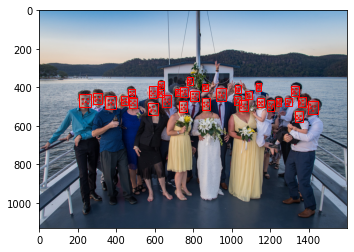

In [78]:
#Load MTCNN network
!pip install mtcnn
from matplotlib import pyplot
from mtcnn.mtcnn import MTCNN
from matplotlib.patches import Circle
from matplotlib.patches import Rectangle
#Solution here:

# draw an image with detected objects
def draw_image_with_boxes(filename, result_list):
	# load the image
	data = pyplot.imread(filename)
	# plot the image
	pyplot.imshow(data)
	# get the context for drawing boxes
	ax = pyplot.gca()
	# plot each box
	for result in result_list:
		# get coordinates
		x, y, width, height = result['box']
		# create the shape
		rect = Rectangle((x, y), width, height, fill=False, color='red')
		# draw the box
		ax.add_patch(rect)
    # draw the dots
		for key, value in result['keypoints'].items():
			# create and draw dot
			dot = Circle(value, radius=2, color='red')
			ax.add_patch(dot)
	pyplot.show()
 
filenames=['test_1.jpg','test_2.jpg','test_3.jpg']
for filename in filenames:
  # load image from file
  pixels = pyplot.imread(filename)
  # create the detector, using default weights
  detector = MTCNN()
  # detect faces in the image
  faces = detector.detect_faces(pixels)
  print(faces)
  # display faces on the original image
  draw_image_with_boxes(filename, faces)


*Discussion here:*

**Compare these results to those from Q1) and discuss.**

Both the face detection and the eye and mouth detection are largely improved. Instead of using a rectangle to mark the eye area, MTCNN model was trained using facial landmarks' coordinate as a regression problem and gave the result as several marking points: left eye, right eye, nose, left mouth corner and right moouth corner.This greatly handle the problems or failures caused by large visual variations of faces, annotations, and extreme lights..

## CelebA Dataset
To quantitatively test the performance of the face detections, we need an annotated dataset. We will use the CelebA dataset. 

CelebFaces Attributes Dataset ([CelebA](https://mmlab.ie.cuhk.edu.hk/projects/CelebA.html)) is a large-scale face attributes dataset with more than 200K celebrity images. The images in this dataset cover large pose variations and background clutter. It contains annotations for face bounding boxes and 5 landmarks:
1. left_eye
2. right_eye
3. nose
4. mouth_left
5. mouth_right

A subset of these images and their annotations are provided in a zip file on google drive. Run the cell below to download and load the data into the workspace.

You can access the image data by: `imgs[#]`

You can access the image filename by: `imgs.files[#].split('/')[-1]`

You can access elements of annoation dataframe in 3 ways:
 1. `anno.loc[image_id,column_name]`
 2. `anno.iloc[row_#,column_#]`
 3. `anno[column_name][row_#/image_id]`



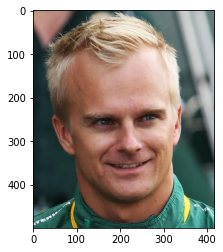

000013.jpg
left-eye coordinates: (165,255)
upper left point of bbox: (89,132)


In [79]:
import io
from googleapiclient.http import MediaIoBaseDownload
from zipfile import ZipFile
import skimage.io 
import matplotlib.pyplot as plt
import pandas as pd

#Download  file
file_id = "1Nt9uUZgssHUlwHbe9LFVZ0hhgaIQmcj-"
request = drive_service.files().get_media(fileId=file_id)
downloaded = io.BytesIO()
downloader = MediaIoBaseDownload(downloaded, request)
done = False
while done is False:
  _, done = downloader.next_chunk()
#Extract zip file
with ZipFile(downloaded) as zipf:
    zipf.extractall()

#Load images
imgs = skimage.io.collection.ImageCollection('celeb_a_mini/imgs/*.jpg')
#Load bounding box
df = pd.read_csv('celeb_a_mini/list_bbox_celeba.txt',delim_whitespace=True,header=1).set_index('image_id')
bbox = df.loc[[f.split('/')[-1] for f in imgs.files]].copy()
#Load landmarks
df = pd.read_csv('celeb_a_mini/list_landmarks_celeba.txt',delim_whitespace=True,header=1)
landmarks = df.loc[[f.split('/')[-1] for f in imgs.files]].copy()
#Combine annotations
anno = pd.concat([bbox,landmarks],axis=1)

#Plot example image
plt.imshow(imgs[10]) #access image data by accessing the array (i.e. imgs[#])
plt.show()
#Print locations of landmarks
print(imgs.files[10].split('/')[-1])
print('left-eye coordinates: ({},{})'.format(anno['lefteye_x'][10],anno['lefteye_y'][10]))
print('upper left point of bbox: ({},{})'.format(anno['x_1'][10],anno['y_1'][10]))

In [80]:
#Display dataframe which contains ground truth annotations
anno.head(7)

,x_1,y_1,width,height,lefteye_x,lefteye_y,righteye_x,righteye_y,nose_x,nose_y,leftmouth_x,leftmouth_y,rightmouth_x,rightmouth_y
image_id,,,,,,,,,,,,,,
000001.jpg,95,71,226,313,165,184,244,176,196,249,194,271,266,260
000002.jpg,72,94,221,306,140,204,220,204,168,254,146,289,226,289
000003.jpg,216,59,91,126,244,104,264,105,263,121,235,134,251,140
000005.jpg,236,109,120,166,273,169,328,161,298,172,283,208,323,207
000006.jpg,146,67,182,252,202,158,259,165,234,196,197,228,243,233
000007.jpg,64,93,211,292,129,198,204,190,163,242,140,277,202,271
000008.jpg,212,89,218,302,279,198,343,205,298,251,275,282,334,284


## Intersection over Union
One metric to evaluate the accuracy of our face detection is Intersection over Union (IoU). IoU is an evaluation metric used to measure the accuracy of an object detector on a particular dataset. More formally, in order to apply IoU to evaluate an object detector we need:
* The ground-truth bounding boxes
* The predicted bounding boxes from our model.

To calculate IoU we use: 

<img src="https://www.pyimagesearch.com/wp-content/uploads/2016/09/iou_equation.png)" width="500">

[Source](https://www.pyimagesearch.com/2016/11/07/intersection-over-union-iou-for-object-detection/)


## Q5) Evaluate Performance using IoU (5)

Calculate the average IoU across all detections over the CelebA dataset using MTCNN and the Cascaded Classifier ("haarcascade_frontalface_default.xml"). Compare the performance of the methods. Show an example of an image with misclassification (IoU < 0.5) for both methods. 

In [81]:
#Solution here:
from collections import namedtuple
#This cell contains pre-defined functions
#get the ground-truth bounding box
def get_gt(idx):
  list=[]
  list.append(anno.iloc[idx,0])
  list.append(anno.iloc[idx,1])
  list.append(anno.iloc[idx,2])
  list.append(anno.iloc[idx,3])
  return list
#get the predicted bounding box from cascade classifier model
def get_pred_cc(idx):
  gray=cv2.cvtColor(imgs[idx],cv2.COLOR_BGR2GRAY)
  faces=face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)
  if not len(faces):
    faces=[0,0,0,0]
    return faces
  else:
    return faces[0]
#get the predicted bounding box from MTCNN model
def get_pred_MTCNN(idx):
  pixels = pyplot.imread(imgs.files[idx])
  detector = MTCNN()
  faces = detector.detect_faces(pixels)
  if not len(faces[0]['box']):
    faces=[0,0,0,0]
    return faces
  else:
    return faces[0]['box']
# define the `Detection` object
def bb_intersection_over_union(boxA, boxB):
	# determine the (x, y)-coordinates of the intersection rectangle
	xA = max(boxA[0], boxB[0])
	yA = max(boxA[1], boxB[1])
	xB = min(boxA[2]+boxA[0], boxB[2]+boxB[0])
	yB = min(boxA[3]+boxA[1], boxB[3]+boxB[1])
	# compute the area of intersection rectangle
	interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
	# compute the area of both the prediction and ground-truth
	# rectangles
	boxAArea = (boxA[2] + 1) * (boxA[3] + 1)
	boxBArea = (boxB[2] + 1) * (boxB[3] + 1)
	# compute the intersection over union by taking the intersection
	# area and dividing it by the sum of prediction + ground-truth
	# areas - the interesection area
	iou = interArea / float(boxAArea + boxBArea - interArea)
	# return the intersection over union value
	return iou

In [82]:
# Here is the main function, runtime is about 3 mins, 
# Give a list of iou values calculated using cascade classifier and one for MTCNN. 
iou_cc_list=[]
iou_MTCNN_list=[]
for i in range(len(imgs)):
  image = cv2.imread(imgs.files[i].split('/')[-1])
  gt=get_gt(i)
  pred1=get_pred_cc(i)
  pred2=get_pred_MTCNN(i)
  iou_cc= bb_intersection_over_union(gt,pred1)
  iou_cc_list.append(iou_cc)
  iou_MTCNN= bb_intersection_over_union(gt,pred2)
  iou_MTCNN_list.append(iou_MTCNN)
print(iou_cc_list,'\n',iou_MTCNN_list)

[0.6305451892589579, 0.7347023554010829, 0.0, 0.7311017023904031, 0.5838176320473505, 0.7227616982495836, 0.4053227240532272, 0.7367661646676887, 0.6852171688095695, 0.7201762669184766, 0.7354182972672053, 0.7393969650880635, 0.7245139876718824, 0.6435150342257105, 0.7404795486600846, 0.7396472328894652, 0.6528776978417267, 0.653241189071808, 0.5262828535669587, 0.5578889800382828, 0.7046621267679414, 0.7087046780486059, 0.584700472284365, 0.6053201970443349, 0.7353672833328567, 0.558970841906187, 0.7378906472710687, 0.5391364543756842, 0.6497675690456658, 0.5023640661938534, 0.6692667706708268, 0.0, 0.0, 0.7395858154799299, 0.7090321587936605, 0.7292944591695065, 0.0, 0.7387429643527205, 0.7323150033944331, 0.4678691706891273, 0.7302977232924693, 0.7400615626432642, 0.726203374090698, 0.7348030308225049, 0.5908096280087527, 0.7392423685178374, 0.7299858496633935, 0.022558778546802497, 0.0, 0.739594083247334, 0.6146220570012392, 0.3821149299872704, 0.6073301259527542, 0.733229329173167

In [83]:
avg_iou_cc=sum(iou_cc_list)/len(iou_cc_list)
avg_iou_MTCNN=sum(iou_MTCNN_list)/len(iou_MTCNN_list)
print("The average IoU across detections using cascade classifier is "+str(avg_iou_cc))
print("The average IoU across detections using MTCNN is "+str(avg_iou_MTCNN))

The average IoU across detections using cascade classifier is 0.5449206644122621
The average IoU across detections using MTCNN is 0.6290026026379759


2
6
32
39
51
55
81


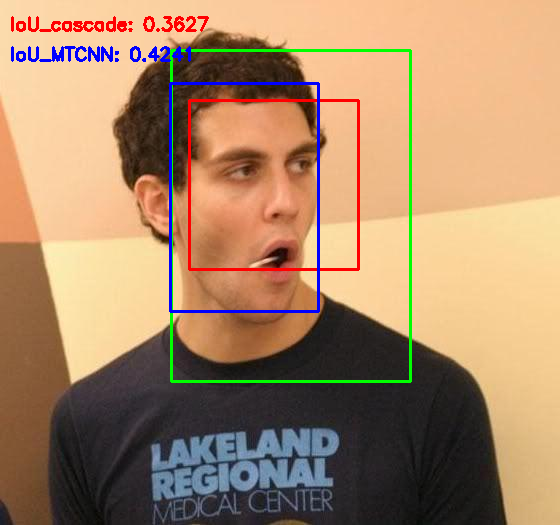

In [84]:
#Show an example of an image with misclassification (IoU < 0.5) for both methods.
#find the index for those images where iou<0.5 for both methods
for i in range (len(iou_cc_list)):
  if (iou_cc_list[i]<0.5) and (iou_MTCNN_list[i]<0.5):
    print(i)
#let us give an example of img[6]
image = cv2.imread(imgs.files[55])
gt=get_gt(55)
gt[2]=gt[0]+gt[2]
gt[3]=gt[1]+gt[3]
pred1=get_pred_cc(55)
pred1[2]=pred1[0]+pred1[2]
pred1[3]=pred1[1]+pred1[3]
pred2=get_pred_MTCNN(55)
pred2[2]=pred2[0]+pred2[2]
pred2[3]=pred2[1]+pred2[3]
cv2.rectangle(image, tuple(gt[:2]), tuple(gt[2:]), (0, 255, 0), 2)
cv2.rectangle(image, tuple(pred1[:2]), tuple(pred1[2:]), (0, 0, 255), 2)
cv2.rectangle(image, tuple(pred2[:2]), tuple(pred2[2:]), (255, 0, 0), 2)
iou1=iou_cc_list[55]
iou2=iou_MTCNN_list[55]
cv2.putText(image, "IoU_cascade: {:.4f}".format(iou1), (10, 30),
cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
cv2.putText(image, "IoU_MTCNN: {:.4f}".format(iou2), (10, 60),
cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
cv2_imshow(image)

*Discussion here:*
**Compare the performance of the methods**

In general, the average IoU across all detections using MTCNN is higher than the that of cascade classifier, which indicates that MTCNN performs better in face detection. For some of the "hard" images in the set, cascade can't even find the face while MTCNN can find, just not very accurate. In all, MTCNN can better handle the large visual variations than cascade classifier, thus has a better performance.

## Bonus: Mean % Error Landmarks (1)
For the correct detections from MTCNN, calculate the average euclidian distance between the predicted landmark with the ground truth landmarks for all landmarks; normalize these values with respect to the inter-ocular distance (ground-truth distance between left and right eyes). Compare the accuracy across the five landmarks.

In [85]:
#Solution here:
from scipy.spatial import distance
sum_ecudis_lefteye=0
sum_ecudis_righteye=0
sum_ecudis_nose=0
sum_ecudis_mouthleft=0
sum_ecudis_mouthright=0
for i in range(len(imgs)):
  pixels = pyplot.imread(imgs.files[i])
  detector = MTCNN()
  faces = detector.detect_faces(pixels)

  pred_lefteye=faces[0]['keypoints']['left_eye']
  gt_lefteye=[anno.iloc[i,4],anno.iloc[i,5]]
  sum_ecudis_lefteye=sum_ecudis_lefteye+distance.euclidean(pred_lefteye, gt_lefteye)

  pred_righteye=faces[0]['keypoints']['right_eye']
  gt_righteye=[anno.iloc[i,6],anno.iloc[i,7]]
  sum_ecudis_righteye=sum_ecudis_righteye+distance.euclidean(pred_righteye, gt_righteye)

  pred_nose=faces[0]['keypoints']['nose']
  gt_nose=[anno.iloc[i,8],anno.iloc[i,9]]
  sum_ecudis_nose=sum_ecudis_nose+distance.euclidean(pred_nose, gt_nose)

  pred_mouthleft=faces[0]['keypoints']['mouth_left']
  gt_mouthleft=[anno.iloc[i,10],anno.iloc[i,11]]
  sum_ecudis_mouthleft=sum_ecudis_mouthleft+distance.euclidean(pred_mouthleft, gt_mouthleft
                                                              )
  pred_mouthright=faces[0]['keypoints']['mouth_right']
  gt_mouthright=[anno.iloc[i,12],anno.iloc[i,13]]
  sum_ecudis_mouthright=sum_ecudis_mouthright+distance.euclidean(pred_mouthright, gt_mouthright)

In [86]:
avg_eucdis_lefteye=sum_ecudis_lefteye/len(imgs)
avg_eucdis_righteye=sum_ecudis_righteye/len(imgs)
avg_eucdis_nose=sum_ecudis_nose/len(imgs)
avg_eucdis_mouthleft=sum_ecudis_mouthleft/len(imgs)
avg_eucdis_mouthright=sum_ecudis_mouthright/len(imgs)
print("The average euclidian distance for left eye is "+ str(avg_eucdis_lefteye))
print("The average euclidian distance for right eye is "+ str(avg_eucdis_righteye))
print("The average euclidian distance for nose is "+ str(avg_eucdis_nose))
print("The average euclidian distance for mouth left is "+ str(avg_eucdis_mouthleft))
print("The average euclidian distance for mouth right is "+ str(avg_eucdis_mouthright))

The average euclidian distance for left eye is 2.520220186385735
The average euclidian distance for right eye is 2.4067470201414336
The average euclidian distance for nose is 2.554640560403204
The average euclidian distance for mouth left is 3.4917673138321605
The average euclidian distance for mouth right is 3.10177164125074


In [87]:
# Normalize these values with respect to the inter-ocular distance 
# ground-truth distance between left and right eyes
# find the min and max of dist between left eye and right eye in ground truth table
import math
dist=[]
for i in range(len(imgs)):
  left=[anno.iloc[i,4],anno.iloc[i,5]]
  right=[anno.iloc[i,6],anno.iloc[i,7]]
  distance=math.sqrt(((left[0]-right[0])**2)+((left[1]-right[1])**2))
  dist.append(distance)
#max(dist)
#min(dist)
# Normalization
deno=max(dist)-min(dist)
norm_avg_eucdis_lefteye=(avg_eucdis_lefteye-min(dist))/deno
norm_avg_eucdis_righteye=(avg_eucdis_righteye-min(dist))/deno
norm_avg_eucdis_nose=(avg_eucdis_nose-min(dist))/deno
norm_avg_eucdis_mouthleft=(avg_eucdis_mouthleft-min(dist))/deno
norm_avg_eucdis_mouthright=(avg_eucdis_mouthright-min(dist))/deno
print("The normalized average euclidian distance for left eye is "+ str(norm_avg_eucdis_lefteye))
print("The normalized average euclidian distance for right eye is "+ str(norm_avg_eucdis_righteye))
print("The normalized average euclidian distance for nose is "+ str(norm_avg_eucdis_nose))
print("The normalized average euclidian distance for mouth left is "+ str(norm_avg_eucdis_mouthleft))
print("The normalized average euclidian distance for mouth right is "+ str(norm_avg_eucdis_mouthright))

The normalized average euclidian distance for left eye is -0.03539918783593649
The normalized average euclidian distance for right eye is -0.035770382102764696
The normalized average euclidian distance for nose is -0.03528659165200822
The normalized average euclidian distance for mouth left is -0.03222105563431007
The normalized average euclidian distance for mouth right is -0.03349681238404563


*Discussion here:*
**Compare the accuracy across the five landmarks.**

As shown in the above result, the average euclidean distance for all of the five landmarks are small  (compared to the inter-ocular distance) which indicates that the overall accuracy for the detection is pretty good. The average euclidean distance for mouth_left and mouth_right is a little bit higher than that for the other three landmarks. So that we can tell the accuracy for detecting eyes and nose are better than for mouth.